In [1]:
import torch
from torch_geometric.data import InMemoryDataset, download_url
import pandas as pd

from torch_geometric.data import Data
from torch_geometric.loader import DataLoader

import numpy as np
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import matplotlib.pyplot as plt

/omics/groups/OE0540/internal/B260/users/olga/.conda/envs/torch_geo/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/omics/groups/OE0540/internal/B260/users/olga/.conda/envs/torch_geo/lib/python3.8/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (1.26.13) or chardet (None)/charset_normalizer (3.1.0) doesn't match a supported version!
  warnings.warn(


# Data loading and preparation

In [12]:
edges = pd.read_csv("../data/interim/edges.csv")

In [14]:
edges[edges.type == "sc2vis"][edges[edges.type == "sc2vis"].celltype_major.isna()]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone


In [15]:
overcl = pd.read_csv("../data/interim/clones_over.csv")

In [16]:
overcl.columns = ["node1","clone"]

In [17]:
overcl

,node1,clone
0,CGCAAGGGTTAGTGAG-1,26
1,CAAGACTAGCTTGAGG-1,26
2,GCCAATACATTGCCTG-1,11
3,CTTCAATAGATGATTG-1,11
4,GATGCAAGTATTGCGT-1,11
...,...,...
10716,TCTAACCCAGGTATTG-1,1
10717,TCAACTAGTTAGCGCC-1,14
10718,CAGGTCAAGACCATTT-1,1
10719,TGGTGCGCACCATCCA-1,1


In [18]:
edges = edges.drop(columns = ["clone"])


In [19]:
overcl = edges[edges["type"] == "sc2vis"].merge(overcl,left_on = "node1",right_on ="node1",how = "left")

In [20]:
overcl.clone = overcl.clone .fillna("diploid")

In [21]:
overcl.clone.unique()

array(['diploid', 19.0, 1.0, 11.0, 4.0, 3.0, 13.0, 14.0, 10.0, 7.0, 12.0,
       5.0, 21.0, 15.0, 24.0, 17.0, 9.0, 8.0, 2.0, 6.0, 0.0, 22.0, 23.0,
       16.0, 20.0, 25.0, 18.0, 26.0], dtype=object)

In [22]:
overcl

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
0,0,AAACAAGCAAACGGGA-1,AATTCTCAGACGCAAC-1,sc2vis,Myeloid,Macrophage,diploid
1,1,AAACAAGCAAACGGGA-1,AGCGACCGTTCTATAC-1,sc2vis,Myeloid,Macrophage,diploid
2,2,AAACAAGCAAACGGGA-1,CTTAGTGCGTTGACGC-1,sc2vis,Myeloid,Macrophage,diploid
3,3,AAACAAGCAAACGGGA-1,GCATACTAGCATCGAA-1,sc2vis,Myeloid,Macrophage,diploid
4,4,AAACAAGCAAACGGGA-1,GCCGATCGAGTGAAGT-1,sc2vis,Myeloid,Macrophage,diploid
...,...,...,...,...,...,...,...
290865,298905,TTTGTGAGTTTGGCCA-1,GAATCATTATGAGCTG-1,sc2vis,Cancer Epithelial,Cancer LumB SC,diploid
290866,298906,TTTGTGAGTTTGGCCA-1,GACGCTGTACAAGGCG-1,sc2vis,Cancer Epithelial,Cancer LumB SC,diploid
290867,298907,TTTGTGAGTTTGGCCA-1,GATCATCGGTGCGTTC-1,sc2vis,Cancer Epithelial,Cancer LumB SC,diploid
290868,298908,TTTGTGAGTTTGGCCA-1,GTATGTTAGACTGCCT-1,sc2vis,Cancer Epithelial,Cancer LumB SC,diploid


In [26]:
edges= edges.merge(overcl[["clone","node1"]],left_on = "node1",right_on ="node1",how = "left")

In [28]:
emb_vis = pd.read_csv("../data/interim/embedding_visium_scvi.csv", index_col = 0)
emb_rna = pd.read_csv("../data/interim/embedding_rna2vis_scvi.csv", index_col = 0)

In [29]:
all_nodes_graph = set(edges.node1.to_list() + edges.node2.to_list())
all_nodes_emb = set(emb_vis.index).union(set(emb_rna.index))
all_nodes = list(all_nodes_graph.intersection(all_nodes_emb))
node_encoder = {all_nodes[i]:i for i in range(len(all_nodes))}
emb_vis = emb_vis.loc[emb_vis.index.isin(all_nodes)]
emb_rna = emb_rna.loc[emb_rna.index.isin(all_nodes)]

In [30]:
edges = edges[edges.node1.isin(all_nodes)]

In [31]:
edges = edges[edges.node2.isin(all_nodes)]

In [32]:
edges.node1 = edges.node1.map(node_encoder)

In [33]:
edges.node2 = edges.node2.map(node_encoder)

In [34]:
emb_vis = emb_vis.rename(index = node_encoder)
emb_rna = emb_rna.rename(index = node_encoder)

In [35]:
len(all_nodes)

34079

In [36]:
edge_index = torch.tensor([edges.node1,
                           edges.node2], dtype=torch.long)

In [37]:
features = pd.concat([emb_vis, emb_rna])

In [38]:
features = features.sort_index()

In [39]:
x = torch.tensor(features.values , dtype=torch.float)

In [40]:
edges[edges.type == "vis2grid"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
2908700,298910,12183,32208,vis2grid,NaN,NaN,NaN
2908701,298911,12183,21829,vis2grid,NaN,NaN,NaN
2908702,298912,31453,1015,vis2grid,NaN,NaN,NaN
2908703,298913,31453,2677,vis2grid,NaN,NaN,NaN
2908704,298914,31453,11844,vis2grid,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2928253,318463,6868,28996,vis2grid,NaN,NaN,NaN
2928254,318464,6868,22009,vis2grid,NaN,NaN,NaN
2928255,318465,6868,29120,vis2grid,NaN,NaN,NaN
2928256,318466,13483,22412,vis2grid,NaN,NaN,NaN


In [41]:
edges.clone = edges.clone.fillna("missing")

In [42]:
edges[edges.clone == "missing"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
2908700,298910,12183,32208,vis2grid,NaN,NaN,missing
2908701,298911,12183,21829,vis2grid,NaN,NaN,missing
2908702,298912,31453,1015,vis2grid,NaN,NaN,missing
2908703,298913,31453,2677,vis2grid,NaN,NaN,missing
2908704,298914,31453,11844,vis2grid,NaN,NaN,missing
...,...,...,...,...,...,...,...
2928253,318463,6868,28996,vis2grid,NaN,NaN,missing
2928254,318464,6868,22009,vis2grid,NaN,NaN,missing
2928255,318465,6868,29120,vis2grid,NaN,NaN,missing
2928256,318466,13483,22412,vis2grid,NaN,NaN,missing


In [43]:
nodes_atr = edges[["node1","type","celltype_major", "clone"]].drop_duplicates()

In [44]:
nodes_atr = nodes_atr.sort_values(by = "node1")

In [45]:
nodes_atr.clone.unique()

array(['diploid', 'missing', 3.0, 1.0, 18.0, 0.0, 17.0, 16.0, 5.0, 9.0,
       2.0, 11.0, 8.0, 7.0, 4.0, 10.0, 13.0, 21.0, 14.0, 25.0, 6.0, 19.0,
       20.0, 23.0, 15.0, 12.0, 24.0, 22.0, 26.0], dtype=object)

In [46]:
nodes_atr.celltype_major = nodes_atr.celltype_major.fillna("missing")

In [47]:
nodes_atr

,node1,type,celltype_major,clone
840700,0,sc2vis,T.cells,diploid
1668300,1,sc2vis,T.cells,diploid
1111600,2,sc2vis,Plasmablasts,diploid
488800,3,sc2vis,T.cells,diploid
2920099,4,vis2grid,missing,missing
...,...,...,...,...
2805900,34074,sc2vis,T.cells,diploid
2154600,34075,sc2vis,Normal Epithelial,21.0
212400,34076,sc2vis,Myeloid,diploid
1856600,34077,sc2vis,Normal Epithelial,4.0


In [48]:
from collections import Counter

Counter(nodes_atr.celltype_major)

Counter({'T.cells': 5983,
         'Plasmablasts': 1275,
         'missing': 4992,
         'Cancer Epithelial': 8503,
         'Myeloid': 3868,
         'CAFs': 2592,
         'Normal Epithelial': 4033,
         'Endothelial': 1346,
         'B.cells': 1018,
         'PVL': 469})

In [49]:
ct_list = list(nodes_atr.celltype_major.unique())
ct_list.remove("missing")

In [50]:
Counter(nodes_atr.clone)

Counter({'diploid': 18692,
         'missing': 4992,
         3.0: 630,
         1.0: 763,
         18.0: 257,
         0.0: 849,
         17.0: 309,
         16.0: 303,
         5.0: 557,
         9.0: 446,
         2.0: 720,
         11.0: 424,
         8.0: 481,
         7.0: 471,
         4.0: 655,
         10.0: 430,
         13.0: 323,
         21.0: 197,
         14.0: 327,
         25.0: 87,
         6.0: 536,
         19.0: 229,
         20.0: 207,
         23.0: 177,
         15.0: 311,
         12.0: 357,
         24.0: 101,
         22.0: 202,
         26.0: 46})

In [51]:
clone_list = list(nodes_atr.clone.unique())
clone_list.remove("missing")
clone_list.remove("diploid")
clone_dict = {x:int(x) for x in clone_list}
clone_dict["missing"] = -1
clone_dict["diploid"] = len(clone_dict)-1

In [52]:
type_dict = {ct_list[i]:i for i in range(len(ct_list))}

In [53]:
type_dict["missing"] = -1

In [54]:
type_dict

{'T.cells': 0,
 'Plasmablasts': 1,
 'Cancer Epithelial': 2,
 'Myeloid': 3,
 'CAFs': 4,
 'Normal Epithelial': 5,
 'Endothelial': 6,
 'B.cells': 7,
 'PVL': 8,
 'missing': -1}

In [55]:
nodes_atr.clone = nodes_atr.clone.map(clone_dict)

In [56]:
edges.celltype_major = edges.celltype_major.fillna("missing")

In [57]:
nodes_atr.celltype_major = nodes_atr.celltype_major.map(type_dict)

In [58]:
nodes_atr = nodes_atr.set_index("node1")

In [59]:
nodes_atr.head()

,type,celltype_major,clone
node1,,,
0,sc2vis,0,27
1,sc2vis,0,27
2,sc2vis,1,27
3,sc2vis,0,27
4,vis2grid,-1,-1


In [60]:
features = features.join(nodes_atr)

In [61]:
features.clone = features.clone.fillna(-1)

In [62]:
features.celltype_major = features.celltype_major.fillna(-1)

In [63]:
y_clone = torch.tensor(features.clone.values,dtype=torch.long)


In [64]:
y_type = torch.tensor(features.celltype_major.values,dtype=torch.long)

In [65]:
y_type.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8])

In [66]:
y_clone.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27])

In [67]:
data = Data(x=x, edge_index=edge_index, y_clone = y_clone,y_type = y_type, edge_type = edges.type.values)

In [68]:
data.validate(raise_on_error=True)


True

In [69]:
hold_out = torch.tensor(np.where(data.y_clone == -1)[0],dtype=torch.long)

In [70]:
tot_size = data.x.shape[0] -len(hold_out)
train_size = int(0.8*tot_size)
hold_in = np.arange(data.x.shape[0])
hold_in = [x for x in hold_in if x not in  hold_out]

In [71]:
len(hold_out)

4992

In [72]:
data.y_type[hold_in].unique()

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [73]:
data.y_clone[hold_in].unique()

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27])

In [74]:
from sklearn.model_selection import train_test_split

train_samp,test_samp,_,_ = train_test_split(hold_in,data.y_clone[hold_in], stratify = data.y_clone[hold_in], test_size=0.2, random_state=42)


In [75]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [76]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [77]:
y_train = data.y_type[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_type = 1. / class_sample_count

In [78]:
y_train = data.y_clone[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_clone = 1. / class_sample_count

In [79]:
weight_clone = torch.tensor(weight_clone, dtype=torch.float)
weight_type = torch.tensor(weight_type, dtype=torch.float)

In [80]:
len(edges.clone.unique())

29

In [81]:
data.num_classes_clone = len(y_clone.unique())
data.num_classes_type = len(y_type.unique())

In [83]:



class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GCNConv(data.num_node_features, 16)
        self.conv2 = GCNConv(16, 16)
        self.conv3 = GCNConv(16, 16)


        # self.conv_clone = GCNConv(16, data.num_classes_clone - 1)
        # self.conv_type = GCNConv(16, data.num_classes_type-1)
        self.out = GCNConv(16,data.num_classes_clone +  data.num_classes_type -2)


    def forward(self, x, edge_index):

        x = self.conv1(x, edge_index)
        x = self.conv2(x, edge_index)
        x = self.conv3(x, edge_index)

        x_pre = F.relu(x)
        # x_pre = F.dropout(x, training=self.training)
        # x_clone = self.conv_clone(x_pre, edge_index)
        # x_type = self.conv_type(x_pre, edge_index)
        x_out = self.out(x_pre, edge_index)


        # return (F.log_softmax(x_clone, dim=1),F.log_softmax(x_type, dim=1))
        return (x_out)

In [84]:
device = torch.device('cpu')
model = GCN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

In [85]:
data = data.to(device)


In [86]:
data.num_classes_clone

29

In [87]:
data.num_classes_type

10

In [88]:
def test():
    model.eval()
    pred = model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_clone = pred_clone.argmax(dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    pred_cell_type = pred_cell_type.argmax(dim=1)

    correct_clones = (pred_clone[data.test_mask] == data.y_clone[data.test_mask]).sum()
    correct_types = (pred_cell_type[data.test_mask] == data.y_type[data.test_mask]).sum()

    acc_clone = int(correct_clones) / len(data.test_mask)
    acc_type = int(correct_types) / len(data.test_mask)
    # reducer = umap.UMAP()
    # emb = pred[-1].detach().numpy()
    # scaled_penguin_data = StandardScaler().fit_transform(emb)
    # embedding = reducer.fit_transform(scaled_penguin_data)
    # sns.scatterplot(x = embedding[:, 0], y = embedding[:, 1], hue = data.node_type)
    # plt.show()
    return(acc_clone,acc_type)

In [89]:
norm_sim = np.load("../data/interim/clone_dist_over.npy")

In [99]:
def weighted_loss(probabilities, norm_sim, target):
        probabilities = torch.exp(probabilities)
        similarity = torch.tensor(norm_sim[target,:]).to(device)
        level_loss=-torch.log((probabilities * similarity).sum(axis = 1)).sum()
        return(level_loss)
def check_split(y):
    #chec if all classes are present in both train and test set
    num_classes = len(y.unique()) -1
    assert sum(y[data.train_mask].unique() == y[data.train_mask].unique()) == num_classes
    

In [100]:
check_split(data.y_type)

In [101]:
check_split(data.y_clone)

In [ ]:
eps = 1e-4
loss_old = 100
loss_clones = []
loss_types = []
aclones = []
atypes = []
model.train()
no_improv = 0
for epoch in range(300):
    optimizer.zero_grad()
    pred= model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    loss_clone = weighted_loss(pred_clone[data.train_mask], norm_sim, data.y_clone[data.train_mask])
    # loss_clone = F.nll_loss(pred_clone[data.train_mask], data.y_clone[data.train_mask], weight = weight_clone)
    loss_type = F.nll_loss(pred_cell_type[data.train_mask], data.y_type[data.train_mask], weight = weight_type)

    acc_clone, a_ct = test()
    if epoch%20==0:
        print(f"epoch {epoch}: Clone prediction loss {loss_clone.item():.3f},Cell type prediction loss: {loss_type.item():.3f}")
        print(f"TEST: Clone accuracy {acc_clone:.4f}, Cell type accuracy: {a_ct:.4f}")
    aclones.append(acc_clone)
    atypes.append(a_ct)

    loss_clones.append(loss_clone.item())
    loss_types.append(loss_type.item())
    # loss = loss_clone + loss_type
    loss = torch.log(torch.sqrt(loss_clone*loss_type))
    loss.backward()
    optimizer.step()
    if (loss_old- loss_clone.item() <eps):
        no_improv += 1
        print(f"no improvement ({no_improv})")
    else:
        no_improv = 0
    if (no_improv >5) & epoch>100:
        print("EARLY STOPPING")
        break
    loss_old = loss_clone.item()


epoch 0: Clone prediction loss 14822.289,Cell type prediction loss: 2.224
TEST: Clone accuracy 0.0069, Cell type accuracy: 0.0352
no improvement (1)
epoch 20: Clone prediction loss 7672.248,Cell type prediction loss: 1.416
TEST: Clone accuracy 0.0352, Cell type accuracy: 0.5571


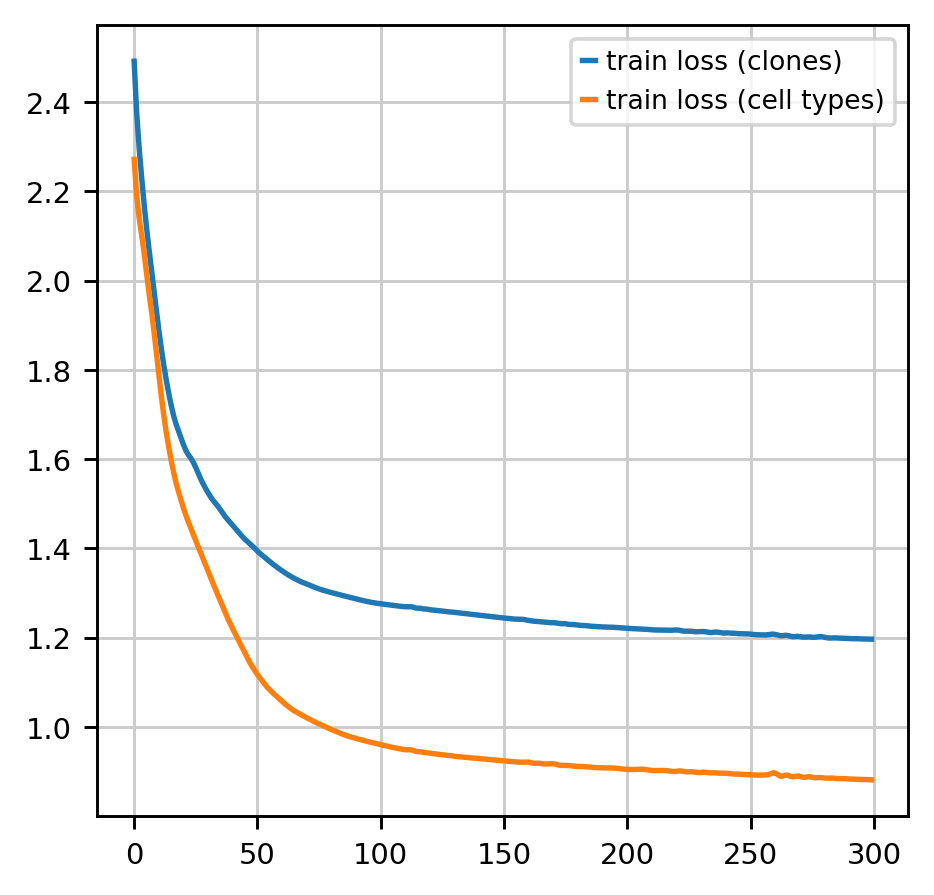

In [201]:
plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(loss_types, label = "train loss (cell types)")
plt.legend()
plt.show()

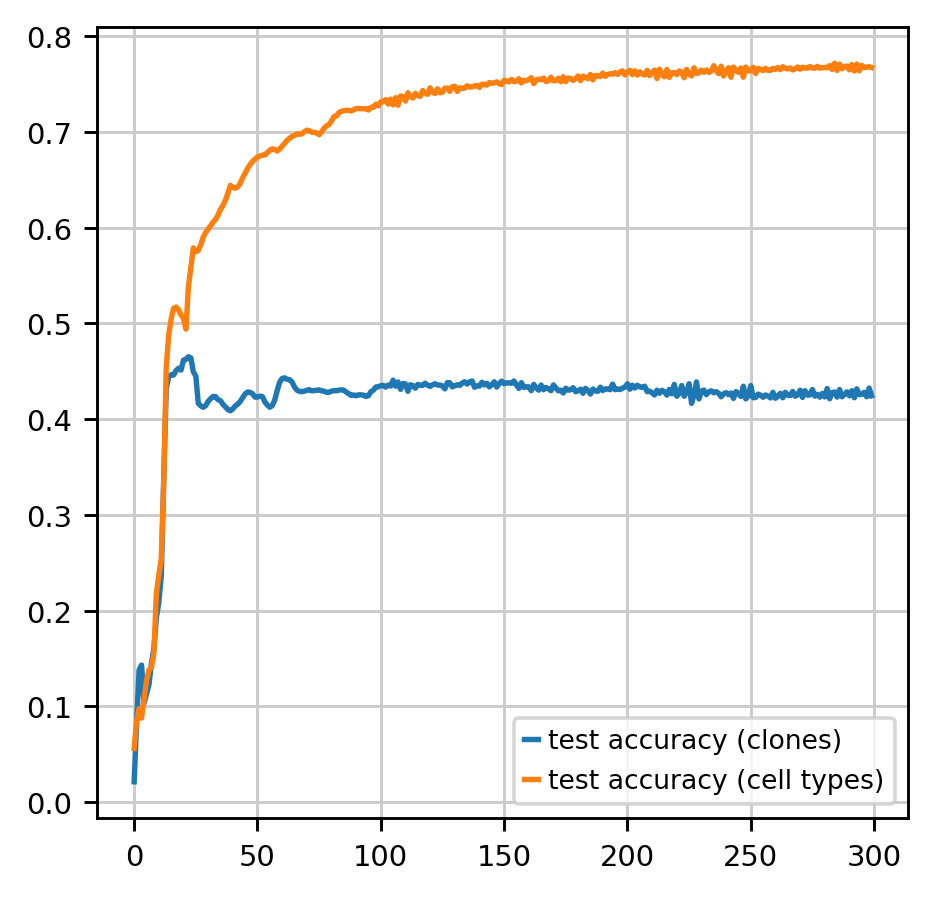

In [97]:
plt.plot(aclones, label = "test accuracy (clones)")
plt.plot(atypes, label = "test accuracy (cell types)")
plt.legend()
plt.show()

In [203]:
from torch_geometric.explain import Explainer, GNNExplainer


In [221]:
# explainer = Explainer(
#     model=model,
#     algorithm=GNNExplainer(epochs=200),
#     explainer_config =dict(
#         explanation_type='model',
#         node_mask_type='attributes',
#         edge_mask_type='object'),
#     model_config=dict(
#         mode='multiclass_classification',
#         task_level='node',
#         return_type='raw',  
#     ),
# )


In [222]:
# explanation = explainer(data.x, data.edge_index, index=10)


In [223]:
# from torch_geometric.explain.metric import fidelity


In [224]:
# explanation

In [225]:
model.eval()
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = F.log_softmax(pred_clone, dim=1)
pred_clone = pred_clone.argmax(dim=1)
pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
pred_cell_type = pred_cell_type.argmax(dim=1)

correct_clones = (pred_clone[data.test_mask] == data.y_clone[data.test_mask]).sum()
correct_types = (pred_cell_type[data.test_mask] == data.y_type[data.test_mask]).sum()

acc_clone = int(correct_clones) / len(data.test_mask)
acc_type = int(correct_types) / len(data.test_mask)

print(f'Accuracy clones: {acc_clone:.4f}')
print(f'Accuracy cell types: {acc_type:.4f}')

Accuracy clones: 0.4352
Accuracy cell types: 0.7784


In [226]:
clone_rev = {val:key for key,val in clone_dict.items()}
type_rev = {val:key for key,val in type_dict.items()}
node_encoder_rev = {val:key for key,val in node_encoder.items()}

In [227]:
pred_clone = np.exp(pred[0].detach().numpy())
pred_cell_type = np.exp(pred[1].detach().numpy())

In [162]:
pred_clone[0,:]

array([9.1179177e-02, 3.0856980e-02, 2.8055461e-02, 3.3740697e-03,
       4.4706021e-04, 3.7473666e-03, 7.9644555e-01, 1.0956670e-03,
       3.1931687e-02, 1.2866927e-02], dtype=float32)

In [102]:
cells_hold_out =[node_encoder_rev[x.item()] for x in data.hold_out]

In [103]:
clone_res = pd.DataFrame(pred_clone[data.hold_out], index = cells_hold_out)

In [104]:
clone_res.columns = [0, 1, 2, 3, 4, 5, 6, 7, 8, "diploid"]

In [105]:
ct_res = pd.DataFrame(pred_cell_type[data.hold_out], index = cells_hold_out)

In [106]:
ct_res.columns = [type_rev[x] for x in ct_res.columns]

In [107]:
import scanpy as sc


In [108]:
path = "../data/raw/visium/"
visium = sc.read_visium(path, genome=None, count_file='CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5',
                        library_id=None, load_images=True, source_image_path=None)
visium.var_names_make_unique()

/omics/groups/OE0540/internal/B260/users/olga/.conda/envs/torch_geo/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [109]:
coor_int = [[int(x[0]),int(x[1])] for x in visium.obsm["spatial"]]
visium.obsm["spatial"] = np.array(coor_int)

In [110]:
clones_columns = clone_res.columns
ct_columns = ct_res.columns

In [111]:
visium.obs = visium.obs.join(clone_res).join(ct_res)

In [112]:
visium.obs["clone"] = visium.obs[clones_columns].idxmax(axis = 1)

In [113]:
visium.obs["clone"].unique()

array([3, 4, 8, 2, 6, 7, 5, 'diploid', 1, 0], dtype=object)

In [128]:
visium.obs.clone = visium.obs.clone.astype("str")

In [135]:
colors = {'8': (0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
 '4': (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 '1': (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 '7': (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 '6': (1.0, 0.4980392156862745, 0.0),
 '5': (1.0, 1.0, 0.2),
 '2': (0.6509803921568628, 0.33725490196078434, 0.1568627450980392),
 '3': (0.9686274509803922, 0.5058823529411764, 0.7490196078431373),
 '0': (0.6, 0.6, 0.6),
 'diploid': '#aec7e8'}

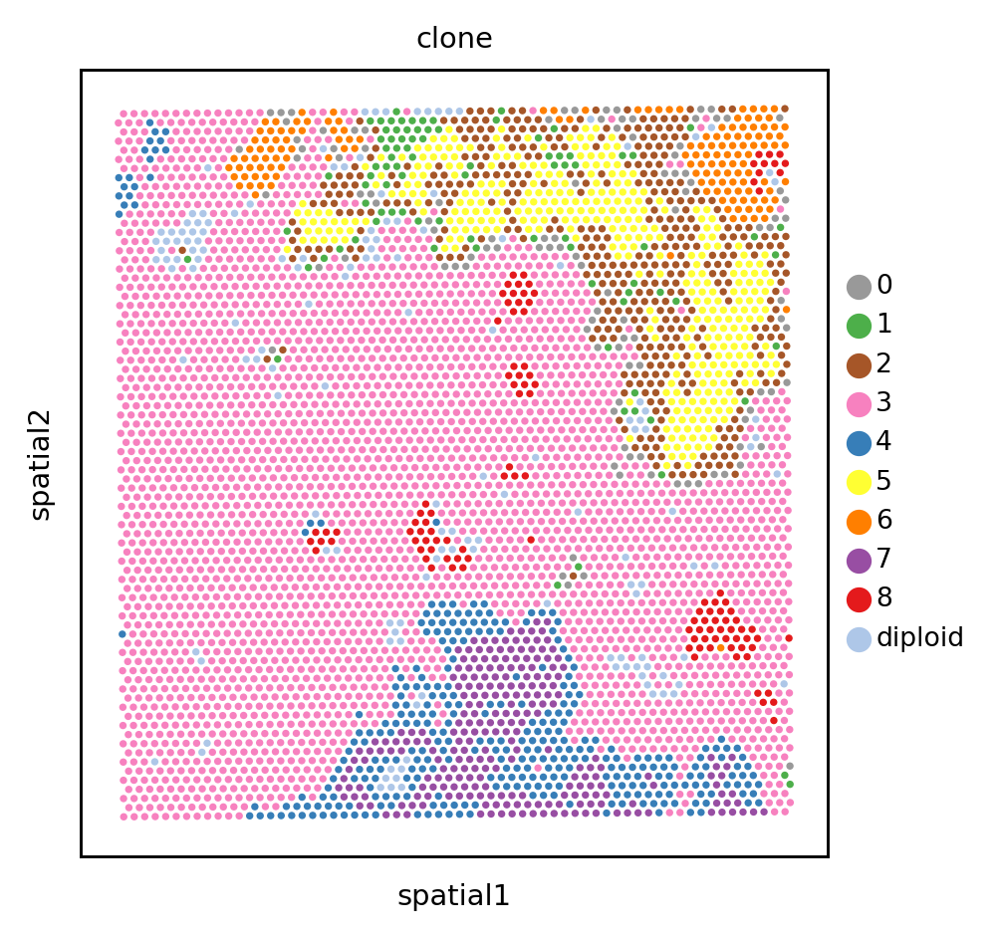

In [136]:
sc.set_figure_params(dpi = 130, scanpy=True, fontsize=8)
sc.pl.spatial(visium, color="clone",alpha = 1, bw = False, alpha_img = 0,
             palette = colors)

In [115]:
import matplotlib as mpl


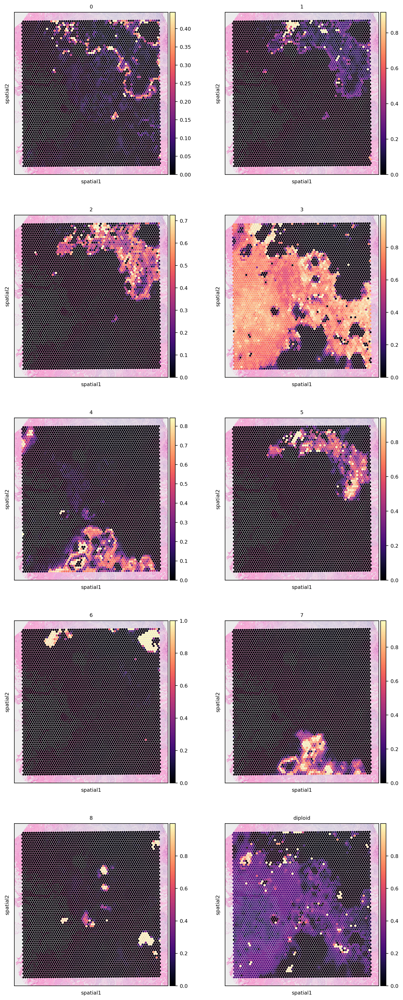

In [116]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=clones_columns,
                  ncols=2, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )